# **Lab 1.2 Image Visualization & Image Arithmetic Operation**

In [29]:
import cv2
import numpy as np
import math
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import mpl_toolkits
import os
import matplotlib.animation as animation
from IPython.display import HTML, display

### **Color Model Visualization**
In this part, you will explore and visualize different color models by separating and displaying each channel individually. The color models we will work with include RGB, HSV, HLS, and YCrCb.<br>

**HINT**: `cv2.cvtColor()`

Display each channel for each color model in RGB space use `direct slicing method (array[...])`.<br>
**Color model:**
- RGB
- HSV
- HLS
- YCrCb



In [30]:
### START CODE HERE ###

img = cv2.imread('images/orange.jpg')

rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
hls_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
ycrcb_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

### END CODE HERE ###

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/image_processing-2024/master/Lab1_image-representation/asset/2-1.png)

</details>

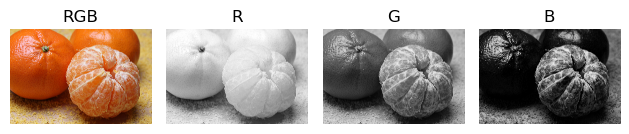

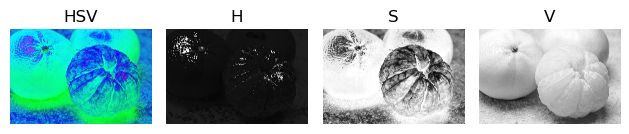

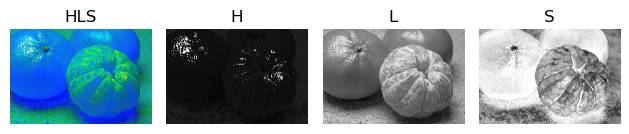

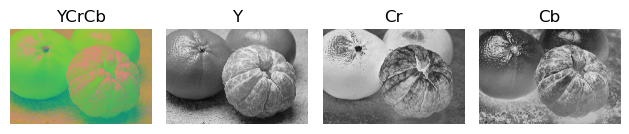

In [31]:
### START CODE HERE ###
def get_channels(img):
    # Split RGB using direct slicing
    c1 = img[..., 0]
    c2 = img[..., 1]
    c3 = img[..., 2]
    return c1, c2, c3

def split_title(title):
    # Split title into channel names based on capital letters
    channel_names = []
    current_word = ''
    for char in title:
        if char.isupper() and current_word:
            channel_names.append(current_word)
            current_word = char
        else:
            current_word += char
    if current_word:
        channel_names.append(current_word)
    return channel_names

def display_channels(c1, c2, c3, original_img, title):
    plt.subplot(1, 4, 1)
    plt.imshow(original_img)
    plt.axis('off')
    plt.title(title)

    channels = [c1, c2, c3]
    channel_names = split_title(title)

    for i, channel in enumerate(channels):
        plt.subplot(1, 4, i + 2)
        plt.imshow(channel, cmap='gray')
        plt.axis('off')
        plt.title(f'{channel_names[i]}')

    plt.tight_layout()
    plt.show()

display_channels(*get_channels(rgb_img), rgb_img, 'RGB')
display_channels(*get_channels(hsv_img), hsv_img, 'HSV')
display_channels(*get_channels(hls_img), hls_img, 'HLS')
display_channels(*get_channels(ycrcb_img), ycrcb_img, 'YCrCb')

### END CODE HERE ###

### **Images addition**
In this part, you will read two images using OpenCV and combine them using a weighted addition. You will explore how changing the weights affects the resulting image.

Read 2 images using OpenCV. Use your own images.

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/image_processing-2024/master/Lab1_image-representation/asset/2-2.png)

</details>

(-0.5, 439.5, 399.5, -0.5)

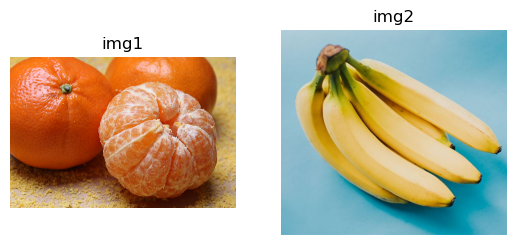

In [32]:
### START CODE HERE ###
img1 = cv2.imread('images/orange.jpg')
img2 = cv2.imread('images/banana.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2)

axs[0].imshow(img1)
axs[0].set_title('img1')
axs[0].axis('off')

axs[1].imshow(img2)
axs[1].set_title('img2')
axs[1].axis('off')
### END CODE HERE ###

Complete `img_addition()` in the cell below.
$$
\begin{align*}
Im\_addition &= w_1Im_1+w_2Im_2 \\
w_1 + w_2 &= 1.0
\end{align*}
$$

In [33]:
### START CODE HERE ###
def img_addition(img1, img2, w1, w2):
    
    if w1 + w2 != 1.0:
        w1 = w1 / (w1 + w2)
        w2 = 1.0 - w1
    img_result = cv2.addWeighted(img1, w1, img2, w2, 0)

    return img_result
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [34]:
a = np.full((20, 20), 255)
b = np.full((20, 20), 255)
test_result = img_addition(a,b,1,1)
assert np.min(test_result) >= 0 and np.max(test_result) <= 255, \
    f"Pixel value out of range: min={np.min(test_result)}, max={np.max(test_result)}"

Use the `img_addition()` function here and save the result to an array for creating a video in a later part. Use weight values in the range [0, 1] with ***at least 20 steps***, ***first increasing from 0 to 1 and then decreasing from 1 back to 0***.

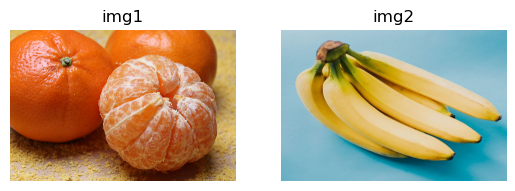

In [35]:
### START CODE HERE ###
num_steps = 20
weights = np.linspace(0, 1, num_steps)

result_images = []

if img1.shape != img2.shape:
    img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0])) 

fig, axs = plt.subplots(1, 2)

axs[0].imshow(img1)
axs[0].set_title('img1')
axs[0].axis('off')

axs[1].imshow(img2)
axs[1].set_title('img2')
axs[1].axis('off')

# Generate images with increasing weights
for w in weights:
    result = img_addition(img1, img2, w, 1 - w)  
    result_images.append(result)

# Generate images with decreasing weights (excluding the first and last to avoid duplication)
for w in weights[-2:0:-1]:
    result = img_addition(img1, img2, w, 1 - w) 
    result_images.append(result)
### END CODE HERE ###

Save the array of images to a video. Please complete the function below.

In [36]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    # Get height and width from the first image in the array
    height, width, _ = image_array[0].shape

    # Initialize video writer with codec and frame rate
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Change codec as necessary
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))

    # Write each frame to the video file
    for frame in image_array:
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        out.write(frame_rgb)
        # out.write(frame)

    # Release resources
    out.release()
    
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [37]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_image_add.mp4")
write_images_to_video(result_images, output_file, frame_rate=30)

Now use `matplotlib.animation` to display the animation from the images array.

In [38]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
artists = []

def animate(i):
    img = ax.imshow(result_images[i])
    return (img,)

for i in range(len(result_images)):
    artists.append(animate(i))

ani = animation.ArtistAnimation(fig=fig, artists=artists, interval=400)

plt.show()
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![addition-2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/image_processing-2024/master/Lab1_image-representation/asset/addition.gif)

</details>

In [39]:
display(HTML(ani.to_jshtml()))

### **Image Bitwise AND operation**
Complete the `create_image_mask()` function in the cell below. Use `np.zeros()` and fill the desired area with 255. This function will return a mask.

In [40]:
### START CODE HERE ###
def create_image_mask(image_size, height, width, x, y):
    # Create an empty mask filled with zeros
    image_mask = np.zeros(image_size, dtype=np.uint8)
    
    # Define the region to be filled with 255 (white)
    image_mask[y:y+height, x:x+width] = 255
    
    return image_mask
### END CODE HERE ###

Use your `create_image_mask()` here and display your mask.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/image_processing-2024/master/Lab1_image-representation/asset/2-3.png)

</details>

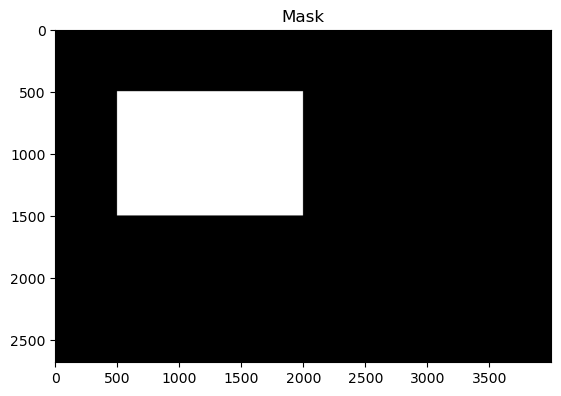

In [41]:
### START CODE HERE ###
# Get the size of img1
height, width, _ = img1.shape

# Define the coordinates and dimensions of the rectangle
# x = np.random.randint(0, width)     
# y = np.random.randint(0, height)    
# h = np.random.randint(1, height - y)
# w = np.random.randint(1, width - x)  

x, y, h, w = 500, 500, 1000, 1500

# Create the image mask
image_mask = create_image_mask((height, width), h, w, x, y)

# Plot the mask
plt.imshow(image_mask, cmap='gray')
plt.title('Mask')
plt.show()
### END CODE HERE ###

Perform the bitwise AND operation between the image and the mask. Then, display the output as shown in the reference image below.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/image_processing-2024/master/Lab1_image-representation/asset/2-4.png)

</details>

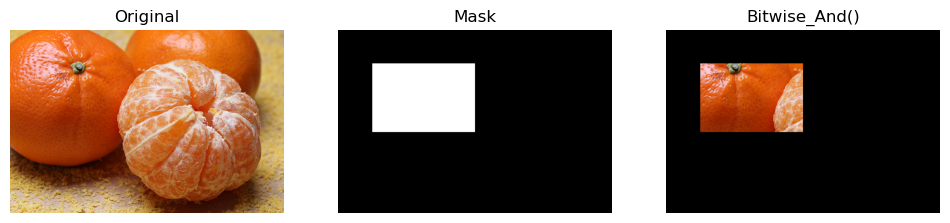

In [42]:
### START CODE HERE ###
# bitwise_and(source1_array, source2_array, destination_array, mask)

''' 
result(x,y)=img1(x,y) AND img1(x,y)if mask(x,y) not equal 0
'''

result = cv2.bitwise_and(img1, img1, mask=image_mask)


fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].imshow(img1)  
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(image_mask, cmap='gray') 
axs[1].set_title('Mask')
axs[1].axis('off')

axs[2].imshow(result)  
axs[2].set_title('Bitwise_And()')
axs[2].axis('off')


plt.show()
### END CODE HERE ###

---

## **Question**
1. When performing image subtraction, how does the order of the images (im1-im2 vs. im2-im1) affect the  resulting image?
2. If we want to censor a part of an image, explain your designed mask and the process using logic operation.
3. How would we obtain background of the scene if there are objects moving all the time and some objects moving very slow and sometimes stay still?

## **Answer**
1.  im1 - im2 : จะทำการลบค่า pixel im2 ออกจาก im1 จึงจะมองเห็น im1 ที่เหลือจากการลบ im2 ออกไป<br />
    im2 - im1 : จะทำการลบค่า pixel im1 ออกจาก im2 จึงจะมองเห็น im2 ที่เหลือจากการลบ im1 ออกไป<br />
    ดังนั้นจะเห็นได้ว่า image subtraction ลำดับของการลบมีผลต่อผลลัพธ์ที่ได้ ซึ่งต่างจาก image addition ที่ลำดับของการบวกไม่มีผลต่อผลลัพธ์ที่ได้<br />
2.  <b>วิธีที่ 1</b> : ใช้ mask : แทนที่ขนาดของ img ทั้งหมดเป็นสีขาว (255), เลือกระยะพื้นที่ที่ต้องการ censor (x,y,h,w) บน img เป็นสีดำ (0) ต่อมานำ img และ mask มา bitwise_and() กัน <br />
    ผลลัพธ์ : จะได้รูปภาพที่เกิดการ ลบภาพที่ไม่ต้องการจากระยะ censor ที่เลือกไว้ออก<br />
    <b>วิธีที่ 2</b> : เบลอรูปภาพนั้นโดยใช้ Image Kernels -> Kernels คือเมทริกซ์ขนาดเล็ก/กรอบ ที่จะเลื่อนไปทีละจุดบนภาพตั้งต้น โดยเลื่อนจากซ้ายไปขวาและบนลงล่าง จุดที่ Kernels เลื่อนไปทับ จะถูกคำนวณร่วมกับค่าในเคอร์เนล โดยค่าในเคอร์เนลจะเปรียบเสมือนน้ำหนักที่กำหนดความสำคัญให้กับจุดต่างๆ ภายในบริเวณรอบๆ ของพิกเซลบนภาพ ซึ่ง <br /><b>การเบลอภาพ: ค่าใน Kernels จะถูกตั้งเป็นค่าเฉลี่ย เพื่อลดความคมชัดของภาพ </b><br />ผลลัพธ์ที่ได้จะกลายเป็นค่าของพิกเซลใหม่  จึงได้ภาพที่เกิดการปรับแต่ง <br />เช่นเมื่อกำหนดให้ kernelเป็ร 3x3 blur kernel จะเกิดการคำนวนค่าเฉลี่ยในจุดรูปภาพนั้นที่ kernel เลื่อนไปทับ เมื่อคำนวนจะได้จุดค่าของพิกเซลใหม่ ผลลัพธ์จะได้เป็นการเบลอภาพนั้นเอง<br />
    ที่มา: https://setosa.io/ev/image-kernels/ , https://cvexplained.wordpress.com/2020/04/30/kernels/
3.  <b>สำหรับวัตถุที่เคลื่อนไหวเร็ว:</b><br/>
    -ใช้เทคนิคค่าเฉลี่ย (Averaging algorithms) คำนวณค่าเฉลี่ยของพิกเซลในบริเวณรอบๆ ของแต่ละพิกเซล<br/>
    -ค่าเฉลี่ยที่ได้จะแทนที่ค่าพิกเซลเดิม ทำให้ผลลัพธ์ที่ได้คือภาพพื้นหลังที่เบลอ วัตถุที่เคลื่อนไหวเร็วจะถูกเบลอไปด้วย<br/>
    <b>สำหรับวัตถุที่เคลื่อนไหวช้า:</b><br/>
    -ใช้เทคนิคการเกลี่ยภาพ (Smoothing algorithms) ปรับค่าพิกเซลให้ใกล้เคียงกับพิกเซลรอบข้าง
    -เทคนิคนี้ช่วยลดความแตกต่างของค่าพิกเซล ทำให้พื้นหลังดูเรียบเนียนขึ้น <br/>
    <b>สำหรับวัตถุที่ไม่เคลื่อนไหว:</b><br/>
    -การเติมเต็มภาพ (Inpainting) เป็นเทคนิค/อัลกอริทึมการประมวลผลภาพที่ใช้เพื่อ เติมเต็มพื้นที่ที่หายไปหรือเสียหายในภาพ โดยใช้ข้อมูลจากบริเวณโดยรอบเพื่อสังเคราะห์เนื้อหาใหม่ที่กลมกลืน เช่น:    การลบวัตถุที่ไม่ต้องการออกจากภาพ: เช่น ป้ายไฟ บุคคลที่ผ่านไป หรือรอยตำหนิ
